In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set_style('darkgrid')

from sklearn.preprocessing import StandardScaler

In [2]:
df = pd.read_csv('data.csv')

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [4]:
df.drop(columns='Id',inplace=True)

### Visualizing Missing Values

In [6]:
missingno = df.isnull().sum().sort_values(ascending=False)

In [7]:
missingno = missingno[missingno != 0]

Text(0.5, 0, 'No Missing Values')

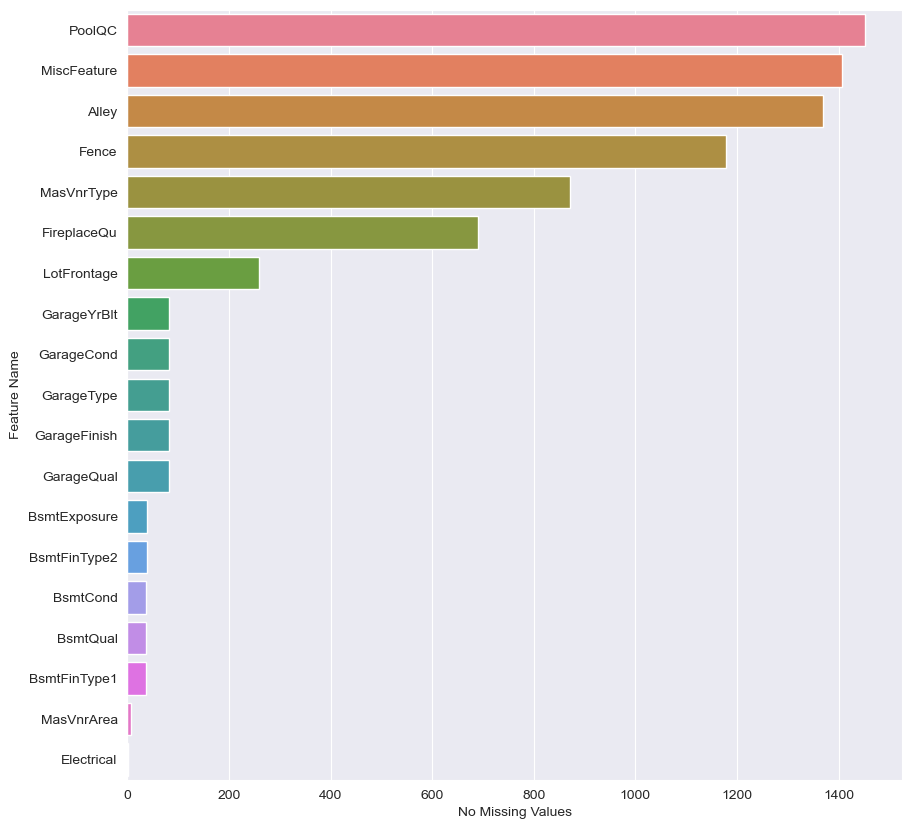

In [8]:
plt.figure(figsize=(10,10))
bar = sns.barplot(x=missingno.values,y=missingno.index,hue=missingno.index)
bar.set_ylabel('Feature Name')
bar.set_xlabel('No Missing Values')

In [9]:
cat_feat = df.select_dtypes('object').columns
num_feat = df.columns.drop(cat_feat)

<Figure size 2000x2000 with 0 Axes>

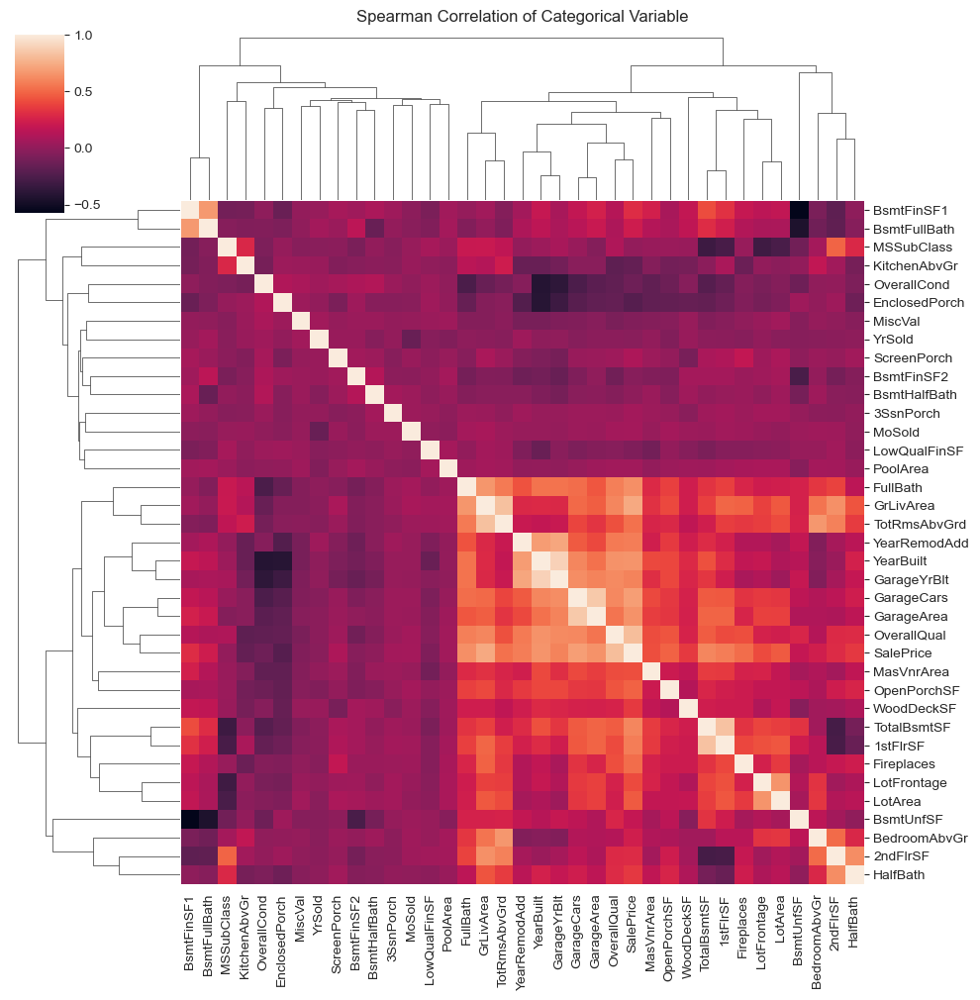

In [10]:
plt.figure(figsize=(20,20))
clst = sns.clustermap(df[num_feat].corr('spearman'))
clst.ax_col_dendrogram.set_title('Spearman Correlation of Categorical Variable')
plt.show()

In [11]:
sns.pairplot(df)

In [12]:
def cramersv_corr(df):
    
    from scipy.stats import chi2_contingency 
    
    df = df.astype('object')
    df = df.fillna('None')
    cols = df.columns
    corr = pd.DataFrame(columns=cols,index=cols)
    for i in range(len(df.columns)):
        for j in range(i,len(cols)):
            col1 = cols[i]
            col2 = cols[j]
            contingency_table = pd.crosstab(df[col1],df[col2])
            chi2, p, dof, expected = chi2_contingency(contingency_table)
            n = contingency_table.sum().sum() 
            min_dim = min(contingency_table.shape) - 1  
            cramersv = np.sqrt(chi2 / (n * min_dim))
            corr.loc[cols[i],cols[j]]=corr.loc[cols[j],cols[i]] = cramersv
    return corr.astype('float')

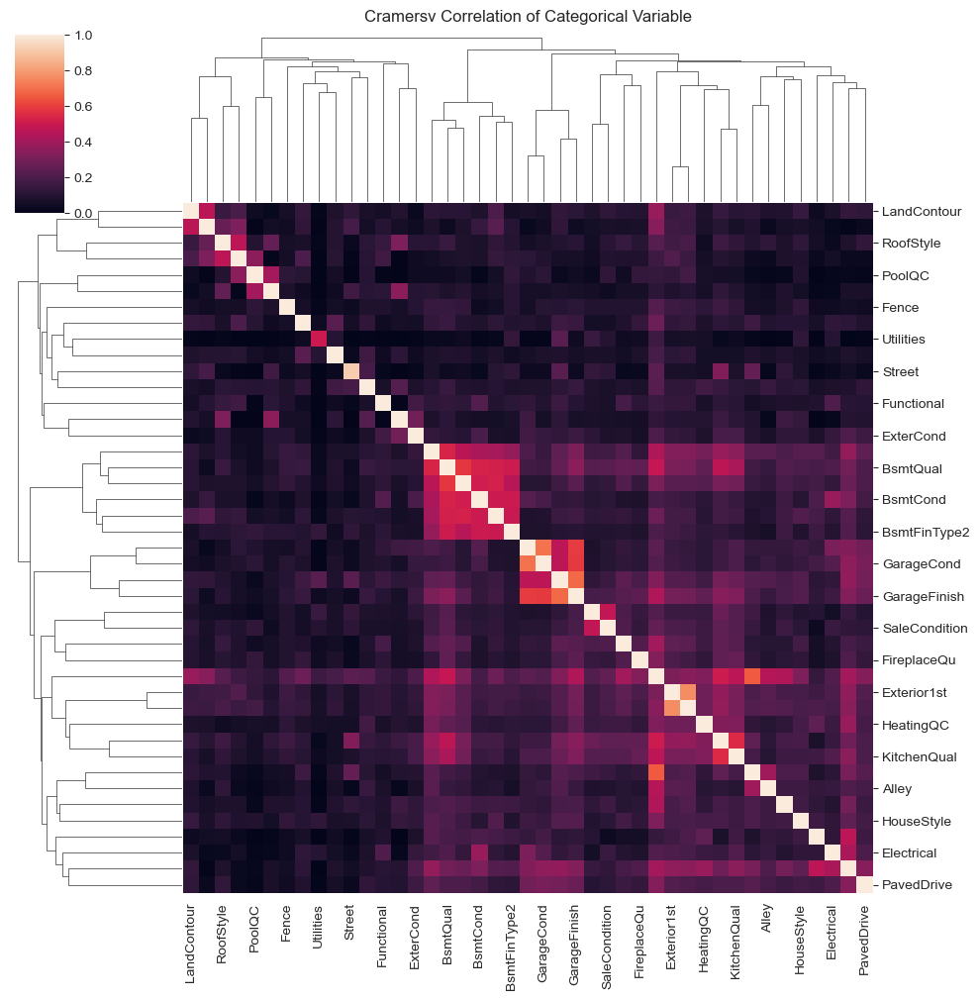

In [13]:
clst = sns.clustermap(cramersv_corr(df[cat_feat]))
clst.ax_col_dendrogram.set_title('Cramersv Correlation of Categorical Variable')
plt.show()

In [14]:
standardized = StandardScaler().set_output(transform='pandas').fit_transform(df[num_feat])

Text(0.5, 1.0, 'Visualizing Outliers')

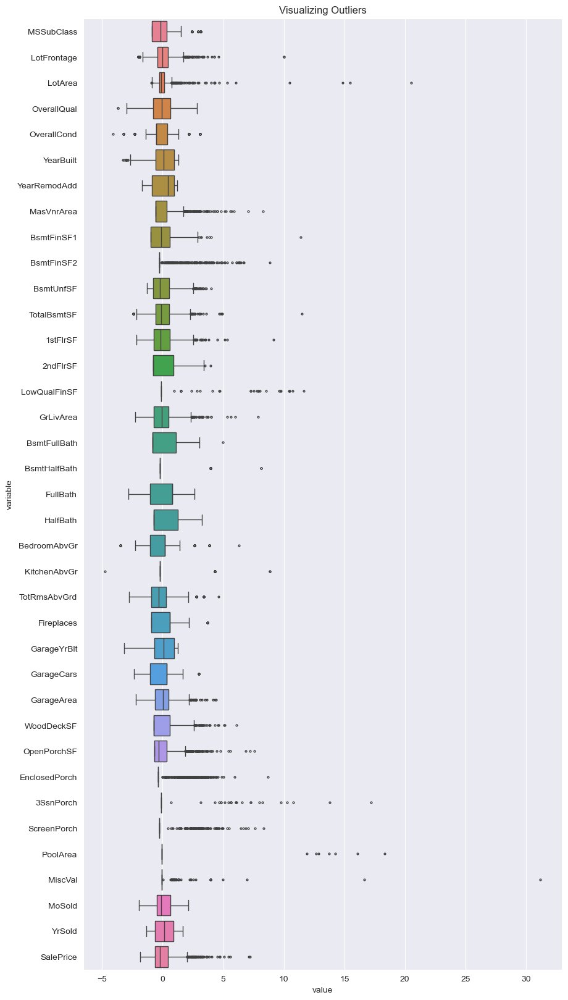

In [15]:
melt = standardized.melt(value_vars=num_feat)
plt.figure(figsize=(10,20))
box= sns.boxplot(melt,x='value',y='variable',fliersize=2,hue='variable')
box.set_title('Visualizing Outliers')

Most of the features are right skewed

In [17]:
def feat_normaltest(df,ci=0.05):

    from scipy.stats import normaltest
    
    df = df.select_dtypes('number')
    normal_test = normaltest(df,axis=0, nan_policy='omit')
    test_results = pd.DataFrame({'columns':df.columns,
                                 'test_statistic':normal_test.statistic,
                                 'pvalue':normal_test.pvalue,
                                 'result':['normal' if pval >= ci else 'not-normal' for pval in normal_test.pvalue]})
    def row_color(row):
        green = 'background-color:#75ff86'
        red = 'background-color:#ff7575'
        return [green if row['result'] == 'normal' else red for _ in row]
    styled_df = test_results.style.apply(row_color,axis=1)
    styled_df.set_table_styles([{'selector':'th.col_heading',
                                            'props':'background-color:#EAEAEA;'}])
    return styled_df

In [18]:
feat_normaltest(df[num_feat])

,columns,test_statistic,pvalue,result
0,MSSubClass,337.186618,0.000000,not-normal
1,LotFrontage,685.402332,0.000000,not-normal
2,LotArea,2590.591868,0.000000,not-normal
3,OverallQual,11.904564,0.002600,not-normal
4,OverallCond,131.291777,0.000000,not-normal
5,YearBuilt,98.332028,0.000000,not-normal
6,YearRemodAdd,2431.493630,0.000000,not-normal
7,MasVnrArea,857.728461,0.000000,not-normal
8,BsmtFinSF1,638.286564,0.000000,not-normal
9,BsmtFinSF2,1287.443707,0.000000,not-normal


None of the featrues are normally distributed

Text(0.5, 0.9, 'Relation of Target Variable with other Numeric Variables')

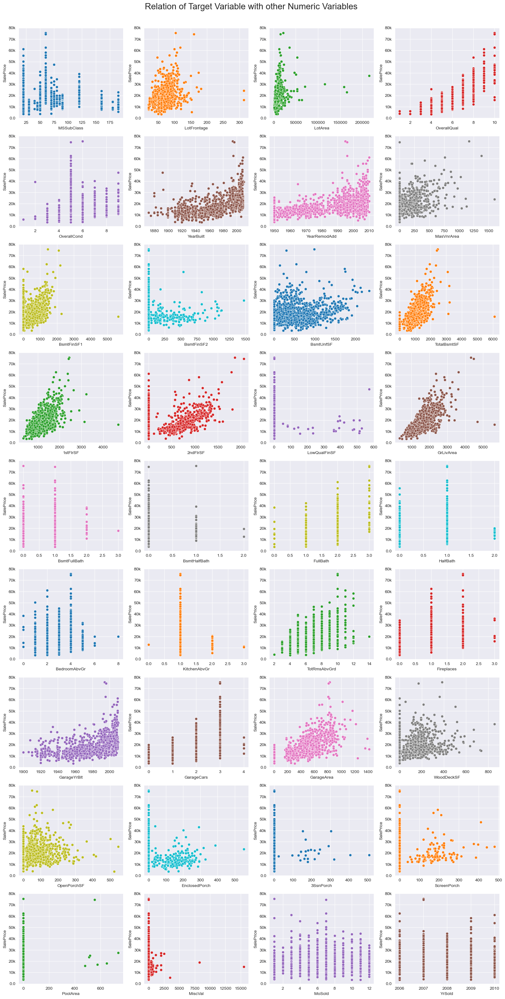

In [20]:
fig, axes = plt.subplots(9,4,figsize=(20,40))

axes = axes.flatten()

num_predictors = df[num_feat].columns.drop('SalePrice')
colors = sns.color_palette(n_colors=len(num_predictors))
for i in range(len(num_predictors)):
    ax = axes[i]
    sns.scatterplot(data=df,y='SalePrice',x=num_predictors[i],ax=ax,color=colors[i])
    ax.set_ylim([0,800000])
    new_ticks = np.char.replace(ax.get_yticks().astype(str),'0000.0','k')
    ax.set_yticks(ax.get_yticks())
    ax.set_yticklabels(new_ticks)
plt.suptitle('Relation of Target Variable with other Numeric Variables',y=0.90,fontsize=20)

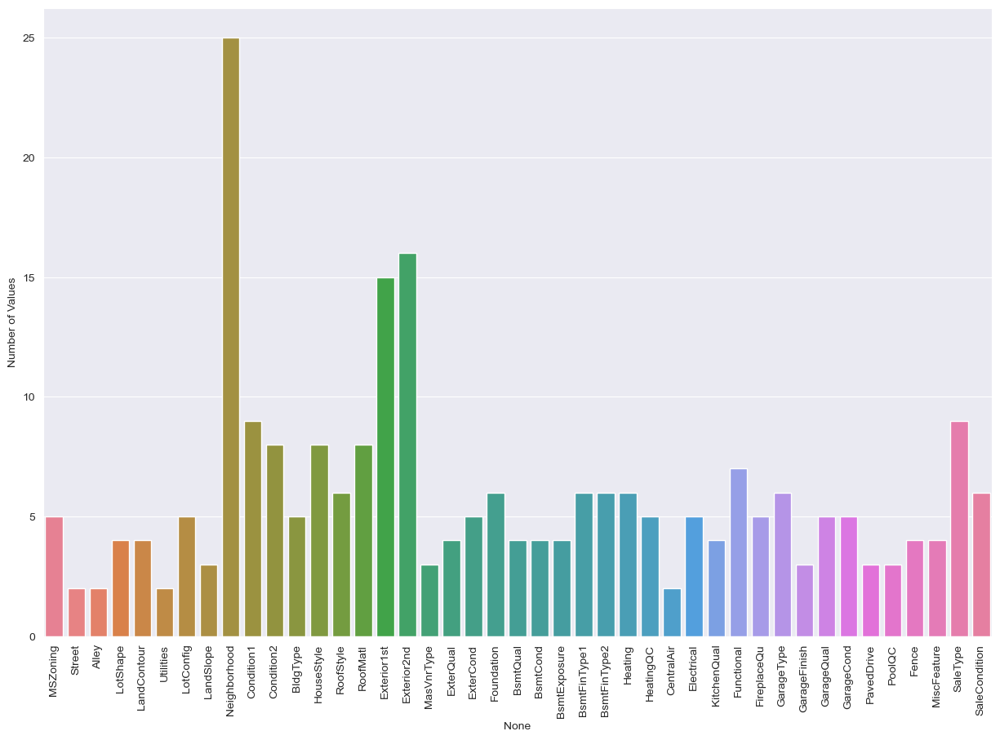

In [21]:
plt.figure(figsize=(15,10))
cardinality = df[cat_feat].nunique()
bar = sns.barplot(y=cardinality.values,x=cardinality.index,hue=cardinality.index)
bar.set_xticks(bar.get_xticks(),bar.get_xticklabels(),rotation=90)
bar.set_ylabel('Number of Values')
plt.show()

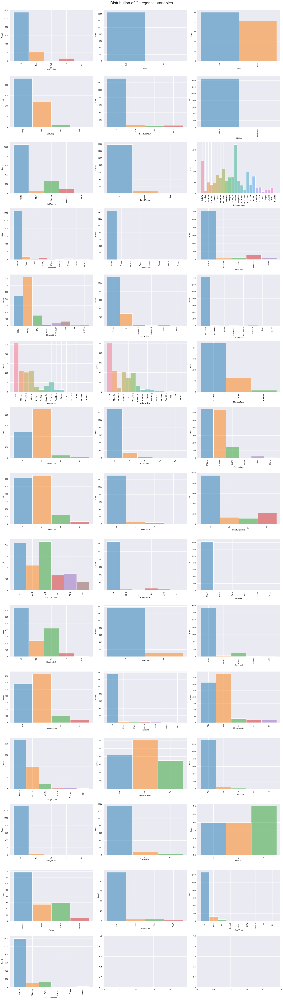

In [22]:
fig, axes = plt.subplots(15,3,figsize=(20,70))

axes = axes.flatten()

for i in range(len(cat_feat)):
    ax = axes[i]
    sns.histplot(data=df,x=cat_feat[i],ax=ax,hue=cat_feat[i])
    ax.set_xticks(ax.get_xticks(),ax.get_xticklabels(),rotation=90)
    ax.get_legend().remove()
plt.suptitle('Distribution of Categorical Variables',y=1,fontsize=20)
plt.tight_layout()

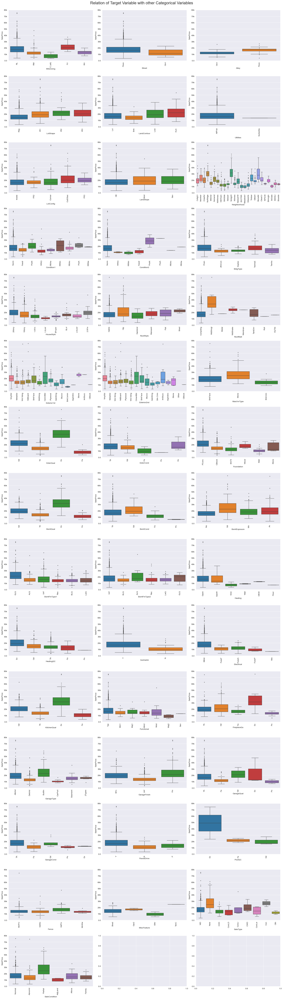

In [23]:
fig, axes = plt.subplots(15,3,figsize=(20,70))

axes = axes.flatten()

for i in range(len(cat_feat)):
    ax = axes[i]
    sns.boxplot(data=df,y='SalePrice',x=cat_feat[i],ax=ax,fliersize=2,hue=cat_feat[i])
    ax.set_ylim([0,800000])
    new_ticks = np.char.replace(ax.get_yticks().astype(str),'0000.0','k')
    ax.set_yticks(ax.get_yticks())
    ax.set_yticklabels(new_ticks)
    ax.set_xticks(ax.get_xticks(),ax.get_xticklabels(),rotation=90)
    if ax.get_legend():
        ax.get_legend().remove()
plt.suptitle('Relation of Target Variable with other Categorical Variables',y=1,fontsize=20)
plt.tight_layout()

Text(0.5, 1.0, 'Target Variable (SalePrice) Distribution')

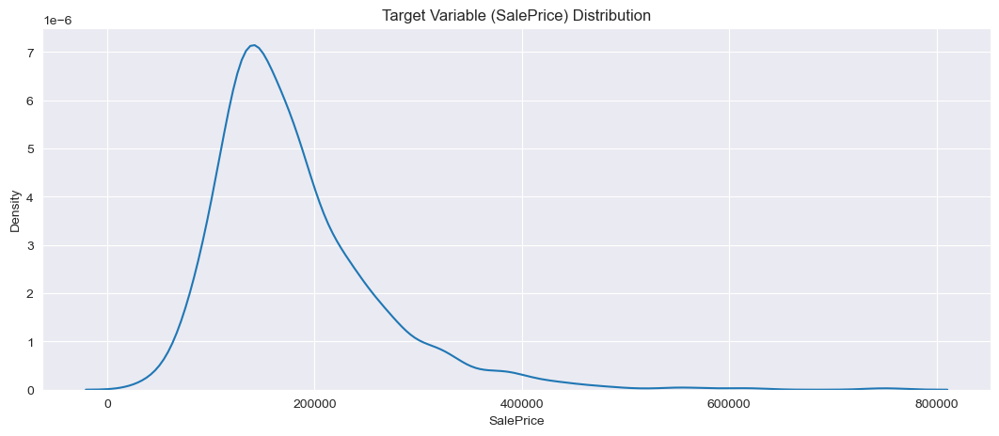

In [24]:
plt.figure(figsize=(13,5))
kde = sns.kdeplot(df.SalePrice)
kde.set_title('Target Variable (SalePrice) Distribution')